### Introduction

This pipeline provide us to build, train and compare models for predict scaled positive (1), and negative (0) changes of cryptocurrency price. Basically we have only 5 columns: (Open, High, Low, Close, Volume) and further we select more as we can, using statistic libraries and additional calculates

### Import necessary libraries

In [1]:
import pandas as pd
import numpy as np
from finta import TA
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf

#### Download data 

In [2]:

import os
import glob
  
# use glob to get all the csv files 
# in the folder
# path = os.getcwd()
csv_files = glob.glob(os.path.join("D:\\Data_trade\\top_marketcap_currencies_5min\\", "*.csv"))

dffs = {}
  
# loop over the list of csv files
for f in csv_files:
    if len(dffs) < 100: # take random 20 from path
    # read the csv file
        try:
            df = pd.read_csv(f)
            if len(df) > 34000:
                dffs[f.split("\\")[-1][:-4]] = df 
            else: continue 
        except: continue
    else: break 
dffs_2 = dffs.copy() 

for i in dffs_2.keys():
    dffs_2[i]['Time'] = pd.to_datetime(np.int64(dffs_2[i]['Time']), unit='ms') 
    dffs_2[i].index = dffs_2[i]['Time']


In [3]:
dffs_2.keys()

dict_keys(['bigdf_ADAUSDT', 'bigdf_ATOMUSDT', 'bigdf_AVAXUSDT', 'bigdf_BNBUSDT', 'bigdf_BTCUSDT', 'bigdf_BUSDUSDT', 'bigdf_DOTUSDT', 'bigdf_ETHUSDT', 'bigdf_LTCUSDT', 'bigdf_LUNAUSDT', 'bigdf_MATICUSDT', 'bigdf_NEARUSDT', 'bigdf_SHIBUSDT', 'bigdf_SOLUSDT', 'bigdf_USTUSDT', 'bigdf_XRPUSDT'])

#### Data Processing & Functions creating

https://towardsdatascience.com/predicting-future-stock-market-trends-with-python-machine-learning-2bf3f1633b3c

In [4]:
# List of symbols for technical indicators

INDICATORS = ['SMA',
'SMM',
'SSMA',
'EMA',
'DEMA',
'TEMA',
'TRIMA',
'TRIX',
'VAMA',
'ER',
'KAMA',
'ZLEMA',
'WMA',
'HMA',
'EVWMA',
'VWAP',
'SMMA',
'FRAMA',
'MACD',
'PPO',
'VW_MACD',
'EV_MACD',
'MOM',
'ROC',
'RSI',
'IFT_RSI',
'TR',
'ATR',
'SAR',
'BBANDS',
'BBWIDTH',
'MOBO',
'PERCENT_B',
'KC',
'DO',
'DMI',
'ADX',
'PIVOT',
'PIVOT_FIB',
'STOCH',
'STOCHD',
'STOCHRSI',
'WILLIAMS',
'UO',
'AO',
'MI',
'VORTEX',
'KST',
'TSI',
'TP',
'ADL',
'CHAIKIN',
'MFI',
'OBV',
'WOBV',
'VZO',
'PZO',
'EFI',
'CFI',
'EBBP',
'EMV',
'CCI',
'COPP',
'BASP',
'BASPN',
'CMO',
'CHANDELIER',
'QSTICK',
# 'TMF',
'WTO',
'FISH',
'ICHIMOKU',
'APZ',
'SQZMI',
'VPT',
'FVE',
'VFI',
'MSD',
'STC',
# 'WAVEPM'
]


def _exponential_smooth(data, alpha):
    """
    Function that exponentially smooths dataset so values are less 'rigid'
    :param alpha: weight factor to weight recent values more
    """
    
    return data.ewm(alpha=alpha).mean()


def _get_indicator_data(data,  column_predict = 'Close'):
    """
    Function that uses the finta API to calculate technical indicators used as the features
    :return:
    """
    indicators_calculates = {}
    dats = data 

    for indicator in INDICATORS:
        ind_data = eval('TA.' + indicator + '(dats)')
        if not isinstance(ind_data, pd.DataFrame):
            ind_data = ind_data.to_frame()
        ind_data.add_prefix(f'{indicator}_')
        if len(ind_data.isna().sum()) == 1:  
            if int(ind_data.isna().sum()) > len(dats)/5 or \
                len(ind_data) <  len(dats) - len(dats)/20: 
                continue
        else:
            if ind_data.isna().sum()[0] > len(dats)/5 or \
                ind_data.isna().sum()[1] > len(dats)/5 or \
                len(ind_data) < len(dats) - len(dats)/20:
                continue
        indicators_calculates[indicator] = ind_data

    for key in indicators_calculates:
        dats = dats.merge(indicators_calculates[key], 
                left_index=True, right_index=True)

    dats = dats[dats.columns[dats[int(len(dats)/2):].isna().sum() == 0]].dropna()

    # return data
             
    dats.rename(columns={"14 period EMV.": '14 period EMV'}, inplace=True)

    # Also calculate moving averages for features
    dats['ema70'] = dats[column_predict] / dats[column_predict].ewm(70).mean()
    dats['ema50'] = dats[column_predict] / dats[column_predict].ewm(50).mean()
    dats['ema38'] = dats[column_predict] / dats[column_predict].ewm(38).mean()
    dats['ema21'] = dats[column_predict] / dats[column_predict].ewm(21).mean()
    dats['ema15'] = dats[column_predict] / dats[column_predict].ewm(14).mean()
    dats['ema5'] = dats[column_predict] / dats[column_predict].ewm(5).mean()

    # Instead of using the actual volume value (which changes over time), we normalize it with a moving volume average
    dats['normVol'] = dats['Volume'] / dats['Volume'].ewm(5).mean()
    
    return dats


# creating target column
def _produce_prediction(data, window, column_predict = 'Close'):
    """
    Function that produces the 'truth' values
    At a given row, it looks 'window' rows ahead to see if the price increased (1) or decreased (0)
    :param window: number of days, or rows to look ahead to see what the price did
    """
    
    prediction = (data.shift(-window)[column_predict] >= data[column_predict])
    prediction = prediction.iloc[:-window]
    data['class'] = prediction.astype(int)
    
    return data


without greadsearch 

In [5]:
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedShuffleSplit
from imblearn.over_sampling import RandomOverSampler
from sklearn.ensemble import VotingClassifier
from sklearn.feature_selection import SelectKBest, chi2
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.model_selection import GridSearchCV

# Let's choose a model for classification
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier

models = {
    "RandomForestClassifier" : RandomForestClassifier(),
    "DecisionTreeClassifier" : DecisionTreeClassifier(), 
    "KNeighborsClassifier" : KNeighborsClassifier(),
    "GradientBoostingClassifier" : GradientBoostingClassifier()
}

def model(name, model, X_train, y_train):
    """
    function provide us train and compare different algorithm using cross validation score
    and accuracy
    """
    model.fit(X_train, y_train)
    score = model.score(X_train, y_train)
    cv_score = cross_val_score(model,X_train, y_train,cv=5)
    return { "acc" :score,  "cv_score" : np.mean(cv_score)} 

def education_model(df, gridsearch = True, preparation_only = False, 
                    oversampling = True, normalization = True, number_pararam = 70, Xy_separating = True): 
    """
    Using of this function is different. We can include/exclude different blocks depends on our task. Basically
    function prepares train data and educates ensemble of the best models. Output also can be represent by different ways 
    """  
    
    df_edu = df
    df_edu = df_edu.loc[:,~df_edu.columns.duplicated()]
    df_edu = df_edu[~df_edu.isin([np.nan, np.inf, -np.inf]).any(1)]
    X = df_edu.drop(['class'], axis=1)
    y = df_edu['class']

    # z = df_edu['profit']
    
    # normalization of data 
    if normalization == True:
        min_max_scaler = preprocessing.MinMaxScaler(feature_range=(0,1))
        headers = list(X.columns)
        index = X.index
        X = min_max_scaler.fit_transform(X)
        X = pd.DataFrame(X)
        X.columns = headers
        X.index = index 

    # Feature Selection - removing unimportant features 
    select = SelectKBest(chi2, k=number_pararam) #70
    X_new = select.fit_transform(X, y)
    X_new = pd.DataFrame(X_new)
    filter = select.get_support()
    X = X[X.columns[filter]]

    # Random oversampling of data
    if oversampling == True:
        ros = RandomOverSampler()
        X_train, y_train  = ros.fit_resample(X, y)
    else: 
        X_train, y_train = X, y

    if preparation_only == False:

        acc = []
        cv_scores = []
        
        for name, clf in models.items():
            acc.append(model(name,clf,  X_train, y_train)['acc'])
            cv_scores.append(model(name,clf,  X_train, y_train)['cv_score'])
                
        dff = pd.DataFrame({'Accuracy': acc,
                    'Cross Val Score': cv_scores}, index=list(models.keys()))
        dff = dff.sort_values(by=['Accuracy','Cross Val Score'], ascending=False)
        top_3_models = dff.index[:3]
        
        models_voting = list()
        

        # we can use gridsearch for the most efficient algorithms 
        if gridsearch == True:
            prms = {'KNeighborsClassifier': { 'n_neighbors': (1,5,10),
                                        'leaf_size': (20,30,40),
                                        'p': (1,2),
                                        'weights': ('uniform', 'distance'),
                                        'metric': ('minkowski', 'chebyshev')}, 
                        'DecisionTreeClassifier':{'max_leaf_nodes': (7, 30, 50, 95), 
                                'min_samples_split': (2, 3, 4)},
                        'RandomForestClassifier':{'n_estimators': [200, 500], 
                                'max_features': ['auto', 'sqrt', 'log2'], 
                                'max_depth': [4, 5, 6, 7], 'criterion': ['gini', 'entropy']},
                    'GradientBoostingClassifier': {
                                "learning_rate": [0.05, 0.1, 0.15, 0.2],
                                "min_samples_split": np.linspace(0.1, 0.5, 12),
                                "min_samples_leaf": np.linspace(0.1, 0.5, 12),
                                "max_depth":[3,5,8],
                                "max_features":["log2","sqrt"],
                                "criterion": ["friedman_mse",  "mae"],
                                "subsample":[0.5, 0.8, 0.9, 0.95, 1.0]
                                }
                                }

            # for m in top_3_models:
            m = top_3_models[0]

            parameters = prms[m]
            estimator = models[m]

            grid_search = GridSearchCV(
                    estimator=estimator,
                    param_grid=parameters,
                    scoring = 'accuracy',
                    cv = 5)

            grid_search.fit(X_train, y_train)

            if m == 'KNeighborsClassifier':
                top_model = KNeighborsClassifier(n_neighbors = grid_search.best_params_['n_neighbors'],
                                                leaf_size =  grid_search.best_params_['leaf_size'],
                                                p =  grid_search.best_params_['p'],
                                                weights = grid_search.best_params_['weights'],
                                                metric = grid_search.best_params_['metric'])
            elif m == 'DecisionTreeClassifier':
                top_model = DecisionTreeClassifier(max_leaf_nodes = grid_search.best_params_['max_leaf_nodes'], 
                                            min_samples_split = grid_search.best_params_['min_samples_split'])
            elif m == 'RandomForestClassifier':
                top_model = RandomForestClassifier(n_estimators = grid_search.best_params_['n_estimators'], 
                                            max_features = grid_search.best_params_['max_features'],
                                            max_depth = grid_search.best_params_['max_depth'])
            else: 
                top_model = GradientBoostingClassifier(learning_rate = grid_search.best_params_['learning_rate'],
                                                min_samples_split =  grid_search.best_params_['min_samples_split'],
                                                min_samples_leaf =  grid_search.best_params_['min_samples_leaf'],
                                                max_depth = grid_search.best_params_['max_depth'],
                                                max_features = grid_search.best_params_['max_features'],
                                                criterion =  grid_search.best_params_['criterion'],
                                                subsample = grid_search.best_params_['subsample']
                                                )
            ensemble = top_model                            
            ensemble.fit(X_train, y_train)
            

        else: 
            for m in top_3_models:
                models_voting.append(( m, models[m])) 
    
            # define the soft voting ensemble
            ensemble = VotingClassifier(estimators=models_voting, voting='soft')

            # fit the model on all available data
            ensemble.fit(X_train, y_train)
        return({
        "ensemble_model": ensemble , 
        "columns_predictors" : X_train.columns,
        'top_3_models' : top_3_models,
        'X_train': X_train,
        'y_train': y_train
         })
    
    elif Xy_separating == False:
        return X_train.merge(y_train, left_index=True, right_index=True), X_train.merge(y_train, left_index=True, right_index=True).columns


    else:
        return({
        "columns_predictors" : X_train.columns,
        'X_train': X_train,
        'y_train': y_train,
        'Scaler': min_max_scaler
         })


def data_preporation(data , list_best_columns, small_data = False, big_frame = {}):
    """
    function help to prepare (normalize) different slice of data to the same distribution as train data 
    """  
    data = data.loc[:, ~data.columns.duplicated()]
    
    if small_data == True: 
        big_frame = big_frame.loc[:,~big_frame.columns.duplicated()]
        data.index = ['return']
        lst_to_drop = [x for x in big_frame.columns if x not in data.columns]
        big_frame = big_frame.drop(lst_to_drop, axis=1 )
        X_1 = pd.concat([big_frame, data ], axis =0)
    else:
        X_1 = data 

    X = X_1.drop(X_1.columns[~X_1.columns.isin(list_best_columns)] , axis=1)   

    # normalization of data
    min_max_scaler = preprocessing.MinMaxScaler(feature_range=(0,1))

    headers = list(X.columns)

    X = min_max_scaler.fit_transform(X)
    X = pd.DataFrame(X)
    X.index = X_1.index
    X.columns = headers
    
    if small_data == False:
        return(X)
    else:
        return(X[X.index == 'return'])


def _exponential_weighted (data):

    """
    rescaling features to exponential weighted and calculating another target-features
    """  
    df = data

    # generating new features based on given columns
    df['Return'] = df.Close - df.Open 
    df['Daily_volatility'] = df.High - df.Low

    ## Computing the exponentially weighted moving variance 
    vewdf = df.ewm(halflife = 10).var() 
    ewdf = df.ewm(halflife = 10 ).mean() 

    ## Average scaling and normalization
    scaled = df.Daily_volatility - ewdf.Daily_volatility 
    scaled = scaled / vewdf.Daily_volatility** 0.5 

    # Convert all three target input series to their scaled versions, 
    # using this code

    df ['ScaledVolatility']= ((df.Daily_volatility -ewdf.Daily_volatility) 
    /vewdf.Daily_volatility** 0.5) 
    df ['ScaledReturn'] = ((df.Return - ewdf.Return) 
    / vewdf.Return** 0.5) 
    df ['ScaledVolume'] = ((df.Volume - ewdf.Volume) 
    / vewdf.Volume** 0.5) 

    df = df.dropna()

    return df 

    

In [6]:
def series_to_supervised_2(data, window=1, lag=1, dropnan=True, without_target= False):
    
    """
    concatenating previous and future rows depending on window/lag size
    """  
    
    cols, names = list(), list()
    # Input sequence (t-n, ... t-1)
    for i in range(window, 0, -1):
        cols.append(data.shift(i))
        names += [('%s(t-%d)' % (col, i)) for col in data.columns]
    
    # Current timestep (t=0)
    cols.append(data)
    names += [('%s(t)' % (col)) for col in data.columns]
    
    if without_target == False:
        # Target timestep (t=lag)
        cols.append(data.shift(-lag))
        names += [('%s(t+%d)' % (col, lag)) for col in data.columns]
        
    # Put it all together
    agg = pd.concat(cols, axis=1)
    agg.columns = names
    # Drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg

In [7]:

def features_selection (train, test, window):
    """
    usunig different previous functions to genereate new features 
    """  
    train = _get_indicator_data(train,  column_predict = 'ScaledReturn')

    train_feature_selection = education_model(train, gridsearch = False, preparation_only = True, 
                                        oversampling = False, Xy_separating = False) 
        
    train = series_to_supervised_2(train_feature_selection[0].drop(['class'], axis=1), 
            window=window, without_target = True) #.rename(columns={"class(t)": "class"}) 

    train = train.merge(train_feature_selection[0]['class'], left_index=True, right_index=True)
    test = _get_indicator_data(test,  column_predict = 'ScaledReturn') # last 100

    prices_test = test['Close']

    test = data_preporation(test,
            train_feature_selection[1])  # columns_predictors

    class_test = test['class']

    test = series_to_supervised_2(test.drop(['class'],axis=1), window=window, 
            without_target = True) #.rename(columns={"class(t)": "class"})

    test = test.merge(class_test, left_index=True, right_index=True)

    test = test.dropna()
    return train, test


def simple_profit_test (test_orig, yhat):

    """
    simple profit test of got model
    """ 

    profit_test = test_orig[['Open', 'Close','class']].merge( 
                    pd.DataFrame(yhat, index = test.index, columns=['class_pred']), left_index = True,
                    right_index= True )

    deposite = 1000
    price_buy = None
    deposite_changes = { 'value':[], 'time':[]}

    for n in profit_test.index:
        slice = profit_test[profit_test.index == n]
        if int(slice['class_pred']) == 1 and price_buy == None:
            bouth = deposite/float(slice['Close'])

            price_buy = float(slice['Close'])
        
        elif int(slice['class_pred']) == 0 and price_buy != None:

            deposite =   bouth * float(slice['Close'])
            price_buy = None 

        else: 
            continue

        deposite_changes['value'].append(deposite)
        deposite_changes['time'].append(n)

    return  deposite, deposite_changes

#### Building a model

In [11]:
import plotly.graph_objects as go

# data review

fig = go.Figure()

fig.add_trace(go.Scatter(x=dffs_2['bigdf_XRPUSDT']['Time'], y=dffs_2['bigdf_XRPUSDT']['Close'],
                    mode='lines',
                    name='profit'))
                    
fig.update_layout(
    autosize=False,
    width=1600,
    height=800,)

In [17]:
n = 1
summary_data = pd.DataFrame()
crrncies = list(dffs_2.keys())
crrncies.remove('bigdf_USTUSDT')

for cur in crrncies:
    if n == 1:
        summary_data = _exponential_weighted(dffs_2[cur]).add_prefix(f'{cur}_')
    else:
        summary_data = summary_data.merge(_exponential_weighted(dffs_2[cur]).add_prefix(f'{cur}_'), 
        left_index=True, right_index = True) 
    n+=1


data = summary_data.rename(columns={"bigdf_XRPUSDT_Open": "Open", "bigdf_XRPUSDT_High": "High", 
                        "bigdf_XRPUSDT_Low": "Low", "bigdf_XRPUSDT_Close": "Close", 
                        "bigdf_XRPUSDT_Volume": "Volume", 'bigdf_XRPUSDT_Return': 'Return',
                        'bigdf_XRPUSDT_Daily_volatility': 'Daily_volatility',
                        'bigdf_XRPUSDT_ScaledVolatility': 'ScaledVolatility',
                        'bigdf_XRPUSDT_ScaledReturn': 'ScaledReturn',
                        'bigdf_XRPUSDT_ScaledVolume': 'ScaledVolume'
                          }).dropna()

df = data.copy() 

n = len(df)
window = 100 # 29
window_shift = 1  # 100

df['Data_window_scaled'] = df.shift(-window_shift)['ScaledReturn']
df_for_comparing = df

# threshold of scaled profit as a class for education of classificator  
df.loc[df['Data_window_scaled']>0.1, 'class' ] = 1
df.loc[df['Data_window_scaled']<=0.1, 'class' ] = 0

#removing na values 
df.dropna(inplace=True)
df['class'] = df['class'].astype(int)

df.drop([ t for t in df.columns if 'Time' in t], axis =1, inplace=True) # removing time cols
df.drop(['Data_window_scaled'], axis =1, inplace=True) 

#split data by smaller train and test slices 
train = df[0:int(n*0.25)]
test = df[int(n*0.25) :int(n*0.35)]
# valid = df[int(n*0.3):int(n*0.45)]

In [18]:
train.groupby('class')['bigdf_ADAUSDT_Open'].transform(lambda x: x.rolling(10, 1).mean())

Time
2021-05-10 11:05:00    1.726100
2021-05-10 11:10:00    1.735500
2021-05-10 11:15:00    1.727300
2021-05-10 11:20:00    1.738150
2021-05-10 11:25:00    1.732667
                         ...   
2021-08-10 03:40:00    1.469120
2021-08-10 03:45:00    1.468340
2021-08-10 03:50:00    1.468330
2021-08-10 03:55:00    1.467200
2021-08-10 04:00:00    1.467440
Name: bigdf_ADAUSDT_Open, Length: 26412, dtype: float64

In [19]:
def pos_neg_ratio(col):
    ratio = col[col > 0].count()/col[col < 0].count()
    return ratio 

copied = train.copy()
copied['time'] = copied.index

z = 0
for n in copied['class'].unique():

    life_time = copied.loc[copied['class'] == n, 'time'].max()-copied.loc[copied['class'] == n, 'time'].min()

    fr = copied[copied['class'] == n] - copied[copied['class'] == n].shift(1)
    fr['time_s'] = fr.time.values.astype(np.int64) // 10 ** 9   
    fr = fr[1:].groupby('class')[fr.columns].agg([pos_neg_ratio, 'mean', 'last'])
    fr.columns = ['_shifted_'.join(x) for x in fr.columns]
    fr['life_time'] = life_time.days
    if z == 0:
        fr_summary = fr
    else:
        fr_summary = pd.concat([fr_summary,fr],axis=0)       

<ipython-input-19-b703cc1697d9>:2: RuntimeWarning:

invalid value encountered in longlong_scalars

<ipython-input-19-b703cc1697d9>:2: RuntimeWarning:

divide by zero encountered in longlong_scalars



In [20]:
fr_summary

,bigdf_ADAUSDT_Open_shifted_pos_neg_ratio,bigdf_ADAUSDT_Open_shifted_mean,bigdf_ADAUSDT_Open_shifted_last,bigdf_ADAUSDT_High_shifted_pos_neg_ratio,bigdf_ADAUSDT_High_shifted_mean,bigdf_ADAUSDT_High_shifted_last,bigdf_ADAUSDT_Low_shifted_pos_neg_ratio,bigdf_ADAUSDT_Low_shifted_mean,bigdf_ADAUSDT_Low_shifted_last,bigdf_ADAUSDT_Close_shifted_pos_neg_ratio,...,ScaledVolume_shifted_pos_neg_ratio,ScaledVolume_shifted_mean,ScaledVolume_shifted_last,class_shifted_pos_neg_ratio,class_shifted_mean,class_shifted_last,time_s_shifted_pos_neg_ratio,time_s_shifted_mean,time_s_shifted_last,life_time
class,,,,,,,,,,,,,,,,,,,,,
0.0,1.048864,-0.000023,-0.0013,1.138273,-0.000023,-0.0013,1.38754,-0.000023,-0.0017,1.375998,...,0.945543,0.000135,2.162905,NaN,0.0,0.0,inf,660.02999,600,91


In [21]:
copied = train.copy()
copied['time'] = copied.index

life_time = copied.loc[copied['class'] == 1, 'time'].max()-copied.loc[copied['class'] == 1, 'time'].min() 

fr = copied[copied['class'] == 1] - copied[copied['class'] == 1].shift(1)
fr['time_s'] = fr.time.values.astype(np.int64) // 10 ** 9
fr = fr[1:].groupby('class')[fr.columns].agg([pos_neg_ratio, 'mean', 'last'])
fr.columns = ['_shifted_'.join(x) for x in fr.columns]

<ipython-input-19-b703cc1697d9>:2: RuntimeWarning:

invalid value encountered in longlong_scalars

c:\Users\George\AppData\Local\Programs\Python\Python39\lib\site-packages\pandas\core\groupby\generic.py:303: FutureWarning:

Dropping invalid columns in SeriesGroupBy.agg is deprecated. In a future version, a TypeError will be raised. Before calling .agg, select only columns which should be valid for the aggregating function.

<ipython-input-19-b703cc1697d9>:2: RuntimeWarning:

divide by zero encountered in longlong_scalars



In [22]:
fr['life_time'] = life_time.days

### Data preparing/ Feature selection 

In [23]:
train_orig = train.copy()
train = _get_indicator_data(train,  column_predict = 'ScaledReturn')

train_feature_selection = education_model(train, gridsearch = False, preparation_only = True, 
                                    oversampling = False, Xy_separating = False) 
    
train = series_to_supervised_2(train_feature_selection[0].drop(['class'], axis=1), 
        window=window, without_target = True) #.rename(columns={"class(t)": "class"}) 

train = train.merge(train_feature_selection[0]['class'], left_index=True, right_index=True)

test_orig = test.copy()
test = _get_indicator_data(test,  column_predict = 'ScaledReturn') # last 100


prices_test = test['Close']

test = data_preporation(test,
         train_feature_selection[1])  # columns_predictors

class_test = test['class']

test = series_to_supervised_2(test.drop(['class'],axis=1), window=window, 
         without_target = True) #.rename(columns={"class(t)": "class"})

test = test.merge(class_test, left_index=True, right_index=True)

test = test.dropna()

In [18]:
test

,bigdf_ADAUSDT_Open,bigdf_ADAUSDT_High,bigdf_ADAUSDT_Low,bigdf_ADAUSDT_Close,bigdf_ADAUSDT_Volume,bigdf_ADAUSDT_Return,bigdf_ADAUSDT_Daily_volatility,bigdf_ADAUSDT_ScaledVolatility,bigdf_ADAUSDT_ScaledReturn,bigdf_ADAUSDT_ScaledVolume,...,High,Low,Close,Volume,Return,Daily_volatility,ScaledVolatility,ScaledReturn,ScaledVolume,class
Time,,,,,,,,,,,,,,,,,,,,,
2021-08-10 04:05:00,1.4585,1.4633,1.4582,1.4630,376469.95,0.0045,0.0051,1.069103,1.918731,-0.219339,...,0.8035,0.8002,0.8025,844047.24,0.0020,0.0033,0.535206,1.251035,-0.144105,1
2021-08-10 04:10:00,1.4630,1.4660,1.4626,1.4659,246787.67,0.0029,0.0034,-0.147699,1.158132,-0.811317,...,0.8058,0.8022,0.8056,627175.21,0.0032,0.0036,0.738594,1.615907,-0.475974,1
2021-08-10 04:15:00,1.4659,1.4692,1.4646,1.4690,284478.42,0.0031,0.0046,0.705867,1.137389,-0.593794,...,0.8064,0.8033,0.8064,1004346.52,0.0008,0.0031,0.311636,0.457580,0.148596,1
2021-08-10 04:20:00,1.4690,1.4692,1.4671,1.4686,213452.50,-0.0004,0.0021,-1.090835,-0.239086,-0.895856,...,0.8083,0.8053,0.8078,1148476.98,0.0015,0.0030,0.217975,0.754928,0.381968,0
2021-08-10 04:25:00,1.4686,1.4695,1.4685,1.4688,168940.38,0.0002,0.0010,-1.649678,0.006056,-1.041054,...,0.8080,0.8066,0.8077,507775.25,0.0000,0.0014,-1.102715,0.013991,-0.717769,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-16 00:35:00,2.4730,2.4780,2.4640,2.4730,934650.30,0.0000,0.0140,1.060820,0.151896,1.331477,...,1.1187,1.1121,1.1163,2096922.00,-0.0004,0.0066,1.427146,-0.059712,2.064974,0
2021-09-16 00:40:00,2.4720,2.4730,2.4650,2.4670,317112.70,-0.0050,0.0080,-0.359598,-0.569887,-0.627374,...,1.1163,1.1127,1.1128,802663.00,-0.0034,0.0036,-0.151814,-1.067851,-0.504921,0
2021-09-16 00:45:00,2.4660,2.4710,2.4630,2.4650,598252.00,-0.0010,0.0080,-0.345801,0.041551,0.286044,...,1.1149,1.1084,1.1114,2082951.00,-0.0014,0.0065,1.294601,-0.331194,1.791144,1


### ML Models training/ evaluating  

In [24]:
modell = education_model(train, gridsearch = False, number_pararam = 60) # training ensemble model

In [25]:
modell['ensemble_model']

VotingClassifier(estimators=[('RandomForestClassifier',
                              RandomForestClassifier()),
                             ('DecisionTreeClassifier',
                              DecisionTreeClassifier()),
                             ('KNeighborsClassifier', KNeighborsClassifier())],
                 voting='soft')

In [26]:
d_val = data_preporation(test.drop('class', axis = 1),
         modell['columns_predictors'])

yhat = modell['ensemble_model'].predict(d_val) 

print(classification_report(test['class'] , yhat , target_names=['0','1'])) 

              precision    recall  f1-score   support

           0       0.57      0.55      0.56      5660
           1       0.48      0.50      0.49      4674

    accuracy                           0.53     10334
   macro avg       0.53      0.53      0.53     10334
weighted avg       0.53      0.53      0.53     10334



In [27]:
from xgboost import XGBClassifier

# XGBModel training 

XGBClass = XGBClassifier(verbosity =1, subsample = 1, min_child_weight = 5, max_depth = 3,
                gamma = 9, colsample_bytree = 1, learning_rate = 0.05 ) 

XGBClass.fit(modell['X_train'] ,modell['y_train'])

d_val = data_preporation(test.drop('class', axis = 1),
         modell['columns_predictors'])

yhat = XGBClass.predict(d_val)

print(classification_report(test['class'] , yhat , target_names=['0','1']))  

              precision    recall  f1-score   support

           0       0.63      0.49      0.55      5660
           1       0.51      0.65      0.57      4674

    accuracy                           0.56     10334
   macro avg       0.57      0.57      0.56     10334
weighted avg       0.58      0.56      0.56     10334



In [ ]:
# Находим диапазон наибольшей точности предсказаний 
# Используем только наиболее вероятный диапазон предсказаний X = 1 остальные приравниваем 0 

### Profit testing 

In [19]:

# Trading emulation approach

step = 0 
n = len(df)
window = 100 # 29
window_shift = 1  # 100
df['Data_window_scaled'] = df.shift(-window_shift)['ScaledReturn']
df_for_comparing = df
df.loc[df['Data_window_scaled']>0.1, 'class' ] = 1
df.loc[df['Data_window_scaled']<=0.1, 'class' ] = 0
df.dropna(inplace=True)
df['class'] = df['class'].astype(int)

df.drop([ t for t in df.columns if 'Time' in t], axis =1, inplace=True)
df.drop(['Data_window_scaled'], axis =1, inplace=True)

while step <= 0.68:

    train = df[int(step*n):int(n*(0.25+step))]
    test = df[int(n*(0.25+step)) :int(n*(0.32+step))]
        
    test_orig = test.copy()

    train, test = features_selection(train, test, window)
    modell = education_model(train, gridsearch = False, preparation_only = True, number_pararam = 50) 

    XGBClass = XGBClassifier(verbosity =1, subsample = 1, min_child_weight = 5, max_depth = 3,
                    gamma = 9, colsample_bytree = 1, learning_rate = 0.05 ) 

    XGBClass.fit(modell['X_train'] ,modell['y_train'])

    d_val = data_preporation(test.drop('class', axis = 1),
            modell['columns_predictors'])

    yhat = XGBClass.predict(d_val)

    print(simple_profit_test(test_orig, yhat)[0])

    step += 0.07

1317.2021531547236
1039.3600493904457
1326.347832156168
1192.5850141771239
899.6500634954037
1031.9227464778319
966.3422213909516
963.2609898564468
1079.304349882727
917.4309423747935


In [28]:
# Results of Strategy of hold  at the same time (ratio to start deposit)

hold_test = test_orig.merge(test, left_index = True, right_index = True)

float(hold_test[hold_test.index == hold_test.index[-1]]['Close']) / float(hold_test[hold_test.index == hold_test.index[0]]['Open'])

1.3084981167608285

In [14]:
profit_test = test_orig[['Open', 'Close','class']].merge( 
                pd.DataFrame(yhat, index = test.index, columns=['class_pred']), left_index = True,
                right_index= True )

deposite = 1000
price_buy = None
dict_deals = {'successful':[],
                'unsuccessful':[]}
dict_values = {'successful':[],
                'unsuccessful':[]}
deposite_changes = { 'value':[], 'time':[]}


for n in profit_test.index:
    slice = profit_test[profit_test.index == n]
    if int(slice['class_pred']) == 1 and price_buy == None:
        bouth = deposite/float(slice['Close'])
        

        price_buy = float(slice['Close'])
    
    elif int(slice['class_pred']) == 0 and price_buy != None:

        deposite =   bouth * float(slice['Close'])

        # print( 'deal measure: ', float(slice['Close']) /price_buy)

        price_buy = None 
    else: 
        continue
    deposite_changes['value'].append(deposite)
    deposite_changes['time'].append(n)

print('summary_profit: ',deposite)

summary_profit:  1572.1540620625144


In [18]:
import plotly.graph_objects as go

fig = go.Figure()
fig.add_trace(go.Scatter(x=deposite_changes['time'], y=deposite_changes['value'],
                    mode='lines',
                    name='profit'))
fig.update_layout(
    autosize=False,
    width=1600,
    height=800,)

In [ ]:
profit_test = test_orig[['Open', 'Close','class']].merge( 
                pd.DataFrame(yhat, index = test.index, columns=['class_pred']), left_index = True,
                right_index= True )

deposite = 1000
price_buy = None
dict_deals = {'successful':[],
                'unsuccessful':[]}
dict_values = {'successful':[],
                'unsuccessful':[]}

for n in profit_test.index:
    slice = profit_test[profit_test.index == n]
    if int(slice['class_pred']) == 1 and price_buy == None:
        price_buy = float(slice['Close'])
    
    elif int(slice['class_pred']) == 0 and price_buy != None:
        deposite = deposite*(float(slice['Close']) /price_buy)
        print( 'deal measure: ', float(slice['Close']) /price_buy)

        price_buy = None 
    else: 
        continue

print('summary_profit: ',deposite)


# for time in test_orig.index:

In [17]:
profit_test.index[-1] - profit_test.index[0]

Timedelta('70 days 11:00:00')

### tensorflow classification 

In [31]:
# tensorflow classification 

# dataframe = X.merge(y, left_index=True, right_index=True)
# train, val = dataframe[:int(len(dataframe)*0.8)], dataframe[int(len(dataframe)*0.8):]
# test_dt = data_preporation(test.drop('class', axis = 1),
#          modell['columns_predictors']).merge(test['class'], left_index=True, right_index=True)

def df_to_dataset(dataframe, shuffle=True, batch_size=32):
  df = dataframe.copy()
  labels = df.pop('class')
  df = {key: value[:,tf.newaxis] for key, value in dataframe.items()}
  ds = tf.data.Dataset.from_tensor_slices((dict(df), labels))
  if shuffle:
    ds = ds.shuffle(buffer_size=len(dataframe))
  ds = ds.batch(batch_size)
  ds = ds.prefetch(batch_size)
  return ds

batch_size = 64
# train_ds = df_to_dataset(train, batch_size=batch_size)
# val_ds = df_to_dataset(val, shuffle=False, batch_size=batch_size)
# test_ds = df_to_dataset(test_dt, shuffle=False, batch_size=batch_size)

### RNN (LSTM)

In [33]:
dfff = pd.read_csv(f'D:\\Data_trade\\top_marketcap_currencies\\bigdf_XRPUSDT.csv')
dfff['Time'] =  pd.to_datetime(np.int64(dfff['Time']), unit='ms') 
dfff.index = dfff['Time']

In [34]:
# more model size 
# try less features 
# check is all the need code copied 

OUT_STEPS = 30
MAX_EPOCHS = 20
num_features = 20

data_all = _exponential_weighted(dfff)

data_all = _exponential_smooth(data_all, 0.25)
data_all = _get_indicator_data(data_all,  column_predict = 'Close')
data_all = _produce_prediction(data_all, window=OUT_STEPS, column_predict = 'Close')

datas_all = data_all
# for cur in frames_top_corr_calculated.keys():
#     data_all = pd.concat([data_all, frames_top_corr_calculated[cur][
#         frames_top_corr_calculated[cur].index.isin(data_all.index)]], axis = 1)

data_all = data_all.dropna()#.drop(['Open', 'High', 'Low', 'Close', 'Volume'], axis=1)
data_all = education_model(data_all, gridsearch = False, 
                        preparation_only = True, oversampling = False, 
                        normalization = True, number_pararam = num_features, Xy_separating=False) 

dff = data_all[0]

In [35]:
dff.head() # add "Close" value to train data 

,ScaledReturn,41 period SMA,18 period TRIMA,14 period RSI,BB_MIDDLE_x,%b,KC_LOWER,14 period STOCH %K,3 period STOCH %D.,14 period stochastic RSI.,...,0_y,signal_y,14 period MFI,VZO,14 period PZO,20 period CCI,CMO,LOWER_y,20 period SQZMI,class
Time,,,,,,,,,,,,,,,,,,,,,
2019-07-20 19:15:00,0.437003,0.111095,0.110866,0.935482,0.112196,0.633522,0.126685,0.907721,0.916714,0.926683,...,0.542824,0.863192,0.944812,0.902046,0.888738,0.571698,0.955129,0.124949,0.0,0.0
2019-07-20 19:30:00,0.459020,0.111216,0.111048,0.936911,0.112412,0.625243,0.126997,0.905632,0.914888,0.933192,...,0.542117,0.873697,0.943495,0.911758,0.904052,0.568200,0.956524,0.125098,0.0,0.0
2019-07-20 19:45:00,0.455635,0.111335,0.111241,0.938400,0.112622,0.618148,0.127310,0.900784,0.911364,0.937196,...,0.526500,0.883014,0.941567,0.919670,0.917309,0.565661,0.957993,0.125235,0.0,0.0
2019-07-20 20:00:00,0.423354,0.111456,0.111443,0.928239,0.112831,0.606994,0.127576,0.863678,0.896443,0.938735,...,0.500341,0.891075,0.900715,0.839197,0.794323,0.561476,0.942113,0.125350,0.0,0.0
2019-07-20 20:15:00,0.389150,0.111578,0.111652,0.876757,0.113030,0.589108,0.127773,0.784227,0.855313,0.935136,...,0.448999,0.897076,0.856823,0.766989,0.687899,0.555748,0.862147,0.125429,0.0,0.0


In [36]:
from scipy import stats

# dff = data_all.copy()

thld = len(dff)
train_df = dff[int(thld*.1)   # 0.4/7 | 7/8 |8/
:int(thld*.4)] 
val_df = dff[int(thld*.4):int(thld*.55)
] 
test_df = dff[int(thld*.55):int(thld*.7)] 

#comparing train/valid/test
print('mannwhitneyu: ',stats.mannwhitneyu( train_df['ScaledReturn'], val_df['ScaledReturn']))
print('ttest_ind: ',stats.ttest_ind(train_df['ScaledReturn'], val_df['ScaledReturn'])) 

mannwhitneyu:  MannwhitneyuResult(statistic=206090850.0, pvalue=0.8249297784321055)
ttest_ind:  Ttest_indResult(statistic=-0.010688583606066643, pvalue=0.9914719560902897)


<AxesSubplot:xlabel='Time'>

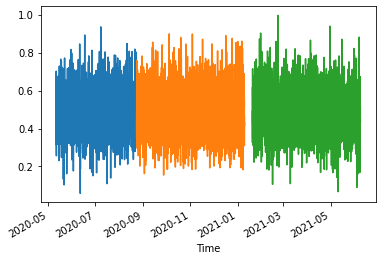

In [37]:
# _exponential_smooth(dff['ScaledReturn'][-150:],  0.25).plot()

train_df['ScaledReturn'][-10000:].plot()
val_df['ScaledReturn'][:-1000].plot()
test_df['ScaledReturn'][:-1000].plot()

In [42]:
class WindowGenerator():
  def __init__(self, input_width, label_width, shift,batch_size,
               train_df=train_df,
                val_df=val_df, 
                test_df=test_df,
               label_columns=None):
    # Store the raw data.
    self.train_df = train_df
    self.val_df = val_df
    self.test_df = test_df
    self.batch_size = batch_size

    # Work out the label column indices.
    self.label_columns = label_columns
    if label_columns is not None:
      self.label_columns_indices = {name: i for i, name in
                                    enumerate(label_columns)}
    self.column_indices = {name: i for i, name in
                           enumerate(train_df.columns)}

    # Work out the window parameters.
    self.input_width = input_width
    self.label_width = label_width
    self.shift = shift

    self.total_window_size = input_width + shift

    self.input_slice = slice(0, input_width)
    self.input_indices = np.arange(self.total_window_size)[self.input_slice]

    self.label_start = self.total_window_size - self.label_width
    self.labels_slice = slice(self.label_start, None)
    self.label_indices = np.arange(self.total_window_size)[self.labels_slice]

  def __repr__(self):
    return '\n'.join([
        f'Total window size: {self.total_window_size}',
        f'Input indices: {self.input_indices}',
        f'Label indices: {self.label_indices}',
        f'Label column name(s): {self.label_columns}'])


def split_window(self, features):
  inputs = features[:, self.input_slice, :]
  labels = features[:, self.labels_slice, :]
  if self.label_columns is not None:
    labels = tf.stack(
        [labels[:, :, self.column_indices[name]] for name in self.label_columns],
        axis=-1)

  # Slicing doesn't preserve static shape information, so set the shapes
  # manually. This way the `tf.data.Datasets` are easier to inspect.
  inputs.set_shape([None, self.input_width, None])
  labels.set_shape([None, self.label_width, None])

  return inputs, labels

WindowGenerator.split_window = split_window

def plot(self, model=None, plot_col='ScaledReturn', max_subplots=3):
  inputs, labels = self.example
  plt.figure(figsize=(12, 8))
  plot_col_index = self.column_indices[plot_col]
  max_n = min(max_subplots, len(inputs))
  for n in range(max_n):
    plt.subplot(max_n, 1, n+1)
    plt.ylabel(f'{plot_col} [normed]')
    plt.plot(self.input_indices, inputs[n, :, plot_col_index],
             label='Inputs', marker='.', zorder=-10)

    if self.label_columns:
      label_col_index = self.label_columns_indices.get(plot_col, None)
    else:
      label_col_index = plot_col_index

    if label_col_index is None:
      continue

    plt.scatter(self.label_indices, labels[n, :, label_col_index],
                edgecolors='k', label='Labels', c='#2ca02c', s=64)
    if model is not None:
      predictions = model(inputs)
      plt.scatter(self.label_indices, predictions[n, :, label_col_index],
                  marker='X', edgecolors='k', label='Predictions',
                  c='#ff7f0e', s=64)

    if n == 0:
      plt.legend()

  plt.xlabel('Time [h]')

WindowGenerator.plot = plot

def make_dataset(self, data):
  data = np.array(data, dtype=np.float32)
  ds = tf.keras.utils.timeseries_dataset_from_array(
      data=data,
      targets=None,
      sequence_length=self.total_window_size,
      sequence_stride=1,
      shuffle=True,
      batch_size=self.batch_size)

  ds = ds.map(self.split_window)

  return ds

WindowGenerator.make_dataset = make_dataset

@property
def train(self):
  return self.make_dataset(self.train_df)

@property
def val(self):
  return self.make_dataset(self.val_df)

@property
def test(self):
  return self.make_dataset(self.test_df)

@property
def example(self):
  """Get and cache an example batch of `inputs, labels` for plotting."""
  result = getattr(self, '_example', None)
  if result is None:
    # No example batch was found, so get one from the `.train` dataset
    result = next(iter(self.train))
    # And cache it for next time
    self._example = result
  return result

WindowGenerator.train = train
WindowGenerator.val = val
WindowGenerator.test = test
WindowGenerator.example = example

def compile_and_fit(model, window, patience=2):
  early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                    patience=patience,
                                                    mode='min')

  model.compile(loss=tf.losses.MeanSquaredError(),
                optimizer=tf.optimizers.Adam(),
                metrics=[tf.metrics.MeanAbsoluteError()])

  history = model.fit(window.train, epochs=MAX_EPOCHS,
                      validation_data=window.val
                      ,
                      callbacks=[early_stopping]
                      )
  return history

### LSTM one step

In [38]:
def create_dataset(dataset, look_back=1):
    dataX, dataY = {}, []
    for i in range(len(dataset)-look_back-1):
        for col in dataset.drop('Close', axis =1).columns:
            a = dataset[col][i:(i+look_back)][0]
            try:
                dataX[col].append(a)
            except:
                dataX[col] = []
                dataX[col].append(a)
        dataY.append(dataset['Close'][i + look_back ])
    return pd.DataFrame(dataX).to_numpy(), np.array(dataY) 

def series_to_supervised_2(data, window=1, lag=1, dropnan=True, without_target= False):
    
    cols, names = list(), list()
    # Input sequence (t-n, ... t-1)
    for i in range(window, 0, -1):
        cols.append(data.shift(i))
        names += [('%s(t-%d)' % (col, i)) for col in data.columns]
    
    # Current timestep (t=0)
    cols.append(data)
    names += [('%s(t)' % (col)) for col in data.columns]
    
    if without_target == False:
        # Target timestep (t=lag)
        cols.append(data.shift(-lag))
        names += [('%s(t+%d)' % (col, lag)) for col in data.columns]
        
    # Put it all together
    agg = pd.concat(cols, axis=1)
    agg.columns = names
    # Drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg

In [39]:
data_searching_window =  datas_all[['Close','ScaledReturn']][:int(len(datas_all)*0.3)]
window = 100 # 29
lag = 30 # 90

td = series_to_supervised_2(data_searching_window, window=window, lag=lag)

In [40]:
correlated = td.corr()['Close(t+30)'].sort_values(ascending=False)

In [43]:
wide_window = WindowGenerator(
    input_width=30, label_width=30, shift=30, batch_size = 32, 
    label_columns=['ScaledReturn']) # or Close?

In [44]:
wide_window

Total window size: 60
Input indices: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29]
Label indices: [30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53
 54 55 56 57 58 59]
Label column name(s): ['ScaledReturn']

In [45]:
lstm_model = tf.keras.models.Sequential([
    # Shape [batch, time, features] => [batch, time, lstm_units]
    tf.keras.layers.LSTM(32, return_sequences=True),
    # Shape => [batch, time, features]
    tf.keras.layers.Dense(units=1)
])

In [46]:
history = compile_and_fit(lstm_model, wide_window)

Epoch 1/20
895/895 [==============================] - 21s 18ms/step - loss: 0.0077 - mean_absolute_error: 0.0650 - val_loss: 0.0061 - val_mean_absolute_error: 0.0590
Epoch 2/20
895/895 [==============================] - 14s 16ms/step - loss: 0.0062 - mean_absolute_error: 0.0592 - val_loss: 0.0061 - val_mean_absolute_error: 0.0589
Epoch 3/20
895/895 [==============================] - 15s 16ms/step - loss: 0.0061 - mean_absolute_error: 0.0588 - val_loss: 0.0060 - val_mean_absolute_error: 0.0583
Epoch 4/20
895/895 [==============================] - 14s 15ms/step - loss: 0.0061 - mean_absolute_error: 0.0587 - val_loss: 0.0060 - val_mean_absolute_error: 0.0583
Epoch 5/20
895/895 [==============================] - 13s 15ms/step - loss: 0.0060 - mean_absolute_error: 0.0586 - val_loss: 0.0060 - val_mean_absolute_error: 0.0584
Epoch 6/20
895/895 [==============================] - 15s 16ms/step - loss: 0.0060 - mean_absolute_error: 0.0585 - val_loss: 0.0060 - val_mean_absolute_error: 0.0585
Epoc

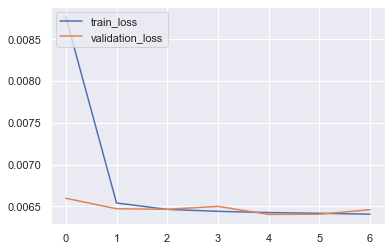

In [69]:
plt.plot(history.history['loss'], label='train_loss')
plt.plot(history.history['val_loss'], label='validation_loss')
plt.legend(loc="upper left")

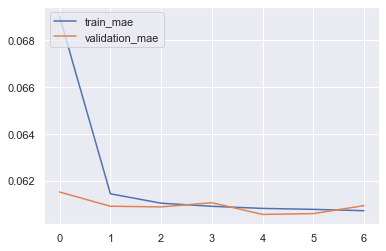

In [70]:
plt.plot(history.history['mean_absolute_error'], label='train_mae')
plt.plot(history.history['val_mean_absolute_error'], label='validation_mae')
plt.legend(loc="upper left")

### Multi window CNN

In [48]:
SHIFT = OUT_STEPS
INPUT_WIDTH = 30
BATCH_SIZE = 32

multi_window = WindowGenerator(input_width=INPUT_WIDTH,
                               label_width=OUT_STEPS,
                               shift=SHIFT,
                               batch_size=BATCH_SIZE,
                               label_columns=['ScaledReturn'])

In [49]:
CONV_WIDTH = 3
multi_conv_model = tf.keras.Sequential([
    # Shape [batch, time, features] => [batch, CONV_WIDTH, features]
    tf.keras.layers.Lambda(lambda x: x[:, -CONV_WIDTH:, :]),
    # Shape => [batch, 1, conv_units]
    tf.keras.layers.Conv1D(128, activation='relu', kernel_size=(CONV_WIDTH),
    #  kernel_regularizer=tf.keras.regularizers.l2(0.001), 
    ), # 256 / 3
    # tf.keras.layers.Dropout(.5),
    # Shape => [batch, 1,  out_steps*features]
    tf.keras.layers.Dense(OUT_STEPS*num_features,
                          kernel_initializer=tf.initializers.zeros()),
    # tf.keras.layers.Dropout(.7),
    # Shape => [batch, out_steps, features]
    tf.keras.layers.Reshape([OUT_STEPS, num_features])
])

history = compile_and_fit(multi_conv_model, multi_window)

Epoch 1/20
895/895 [==============================] - 5s 5ms/step - loss: 0.0095 - mean_absolute_error: 0.0697 - val_loss: 0.0062 - val_mean_absolute_error: 0.0598
Epoch 2/20
895/895 [==============================] - 4s 4ms/step - loss: 0.0061 - mean_absolute_error: 0.0592 - val_loss: 0.0060 - val_mean_absolute_error: 0.0588
Epoch 3/20
895/895 [==============================] - 3s 4ms/step - loss: 0.0060 - mean_absolute_error: 0.0588 - val_loss: 0.0059 - val_mean_absolute_error: 0.0585
Epoch 4/20
895/895 [==============================] - 3s 4ms/step - loss: 0.0060 - mean_absolute_error: 0.0587 - val_loss: 0.0059 - val_mean_absolute_error: 0.0582
Epoch 5/20
895/895 [==============================] - 3s 4ms/step - loss: 0.0059 - mean_absolute_error: 0.0586 - val_loss: 0.0059 - val_mean_absolute_error: 0.0582
Epoch 6/20
895/895 [==============================] - 4s 4ms/step - loss: 0.0059 - mean_absolute_error: 0.0585 - val_loss: 0.0059 - val_mean_absolute_error: 0.0587
Epoch 7/20
895/8

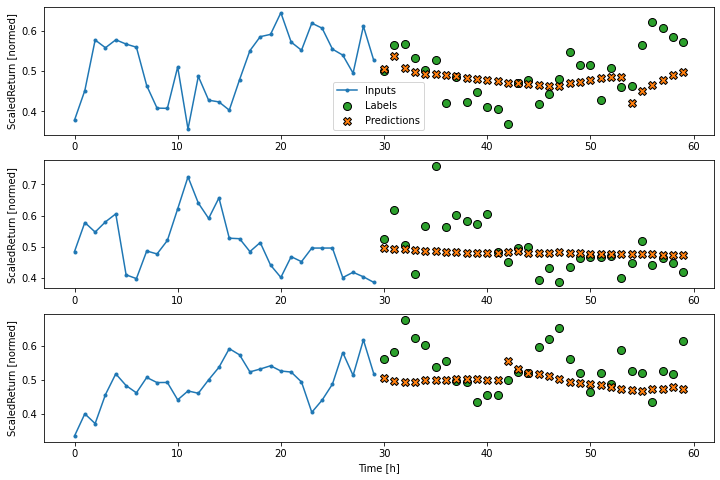

In [50]:
multi_window.plot(lstm_model)

In [51]:
test_dtt = multi_window.make_dataset(test_df[:60]) 
predict = multi_conv_model.predict(test_dtt)

In [52]:
import plotly.graph_objects as go
from sklearn.metrics import mean_squared_error

test_dtt = multi_window.make_dataset(test_df[:60]) 
predict = multi_conv_model.predict(test_dtt)
lst_predicts = [i[1] for i in predict[0]]
real_data = test_df['ScaledReturn'][:96]

fig = go.Figure()


print('RMSE :', np.sqrt(mean_squared_error(test_df['ScaledReturn'][60:90], lst_predicts)))
# Add traces
fig.add_trace(go.Scatter(x=real_data[60:].index, y=lst_predicts,
                    mode='lines',
                    name='forecast'))

fig.add_trace(go.Scatter(x=real_data.index, y=real_data,
                    mode='lines',
                    name='real_data'))


RMSE : 0.06011271527486159


## Results (different approaches to emulation of trading / evaluation)

In [ ]:
# Executing a top of predictors anoter currencies
# download correlation data 

frame_top_correlation =  {}


dict_correlations = pd.read_csv("D:\\Data_trade\\top_marketcap_currencies\\dict_correlations.csv", index_col = 0)


for currency in list(dffs_2.keys())[1:]: #dffs_2.keys()
    # currency = currency.split('_')[1]
    curr = dict_correlations.sort_values(by = f'{currency}'+ '_mean', 
            ascending= False).index
    currencies = []
    intervals = []
    columns = []

    for m in curr:
        if 'df_'+m.split('_')[1] in currencies:
            continue 
        else:
            currencies.append('df_'+m.split('_')[1])

        intervals.append(m.split('_')[2])
        columns.append(dict_correlations[dict_correlations.index == m
                ][currency + '_add_parameters'][0]) 
        if len(np.unique(currencies)) == 5: break 
        
    frame_top_correlation[currency] = pd.DataFrame({ 'intervals' : intervals,
        'currencies': currencies,
        'columns' : columns})

In [ ]:
time_resample = '15min' #15min 
fr = frame_top_correlation['df_XRPUSDT'] #df_XRPUSDT
frames_top_corr_calculated = {}

for cur in fr['currencies']:
    fr_cr_1 = dffs_2[cur].resample(time_resample).pad().dropna()# [fr[fr['currencies'] == cur]['columns']]
    step_cr_1 = np.int(fr[fr['currencies'] == cur]['intervals'])

    fr_cr_1 = _exponential_smooth(fr_cr_1, 0.65)
    fr_cr_1 = _get_indicator_data(fr_cr_1)
    fr_cr_1 = fr_cr_1.drop(['Open', 'High', 'Low', 'Close', 'Volume'], axis=1)
    index = fr_cr_1.index[step_cr_1:]
    fr_cr_1 = fr_cr_1[:-step_cr_1]
    fr_cr_1.index = index 
    fr_cr_1 = fr_cr_1.add_suffix(f'_{cur}').dropna()
    frames_top_corr_calculated[f'{cur}'] = pd.DataFrame(fr_cr_1)

In [96]:

def simple_profit_test (prices_changing, data_classes,  forecasts, deposite = 1000 ):

    profit_test = prices_changing # df # 10% 76% 
    profit_test['action'] = forecasts
    profit_test['should_be'] = data_classes
    deposite = 1000
    price_buy = None 
    dict_deals = {'successful':[],
                    'unsuccessful':[]}
    dict_values = {'successful':[],
                    'unsuccessful':[]}
    deposite_changes_list = []

    for time in profit_test.index:
        if int(profit_test[profit_test.index == time]['action']) == 1 and price_buy == None:
            price_buy = float(profit_test[profit_test.index == time]['Close'])
        elif int(profit_test[profit_test.index == time]['action']) == 0 and price_buy != None:
            if float(profit_test[profit_test.index == time]['Close'])/price_buy > 1: 
                dict_deals['successful'].append(time)
                dict_values['successful'].append(float(profit_test[profit_test.index == time]['Close']))
            elif float(profit_test[profit_test.index == time]['Close'])/price_buy < 1:
                dict_deals['unsuccessful'].append(time)
                dict_values['unsuccessful'].append(float(profit_test[profit_test.index == time]['Close']))
            deposite = float(profit_test[profit_test.index == time]['Close'])/price_buy*deposite
            price_buy = None 
        else: 
            continue 
        deposite_changes_list.append(deposite)

    return deposite, deposite_changes_list, dict_deals, dict_values

In [97]:
spt = simple_profit_test(pd.DataFrame(prices_test),test['class'], yhat)

In [98]:
# Way 1 // sell at the predicted moment

profit_test = pd.DataFrame(prices_test[prices_test.index.isin(test.index)].copy())  # 10% 76%
profit_test['action'] = yhat
profit_test['should_be'] = test['class']
deposite = 1000/window_shift
price_buy = None 
dict_deals = {'successful':[],
                'unsuccessful':[]}
dict_values = {'successful':[],
                'unsuccessful':[]}

for time in profit_test.index:
    if int(profit_test[profit_test.index == time]['action']) == 1 and price_buy == None:
        price_buy = float(profit_test[profit_test.index == time]['Close'])
    elif int(profit_test[profit_test.index == time]['action']) == 0 and price_buy != None:
        if float(profit_test[profit_test.index == time]['Close'])/price_buy > 1: 
            dict_deals['successful'].append(time)
            dict_values['successful'].append(float(profit_test[profit_test.index == time]['Close']))
        elif float(profit_test[profit_test.index == time]['Close'])/price_buy < 1:
            dict_deals['unsuccessful'].append(time)
            dict_values['unsuccessful'].append(float(profit_test[profit_test.index == time]['Close']))
        deposite = float(profit_test[profit_test.index == time]['Close'])/price_buy*deposite
        price_buy = None 
    else: 
        continue
    print(deposite, time)
print('summary_profit: ',deposite, 'test_period: ', test.index[-1] - test.index[0])

241.37489590946453

In [ ]:
profit_test = pd.DataFrame(prices_test[prices_test.index.isin(test.index)].copy())  # 10% 76%
profit_test['action'] = yhat
profit_test['should_be'] = test['class']
deposite = 1000
price_buy = None 
dict_deals = {'successful':[],
                'unsuccessful':[]}
dict_values = {'successful':[],
                'unsuccessful':[]}

for time in profit_test.index:
    if int(profit_test[profit_test.index == time]['action']) == 1 and price_buy == None:
        price_buy = float(profit_test[profit_test.index == time]['Close'])
    elif int(profit_test[profit_test.index == time]['action']) == 0 and price_buy != None:
        if float(profit_test[profit_test.index == time]['Close'])/price_buy > 1: 
            dict_deals['successful'].append(time)
            dict_values['successful'].append(float(profit_test[profit_test.index == time]['Close']))
        elif float(profit_test[profit_test.index == time]['Close'])/price_buy < 1:
            dict_deals['unsuccessful'].append(time)
            dict_values['unsuccessful'].append(float(profit_test[profit_test.index == time]['Close']))
        deposite = float(profit_test[profit_test.index == time]['Close'])/price_buy*deposite
        price_buy = None 
    else: 
        continue
    print(deposite, time)
print('summary_profit: ',deposite, 'test_period: ', test.index[-1] - test.index[0])

In [200]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=dict_deals['unsuccessful'] , y=dict_values['unsuccessful'],
                    mode='lines',
                    name='profit'))


### test with calculations (trading emulation)

In [ ]:
import time
import datetime 

n = len(df)
validation = df[int(n*0.3):int(n*0.7)] #valid = 
deposite = 1000
price_buy = None 

dict_deals = {'successful':[],
                'unsuccessful':[]}
dict_values = {'successful':[],
                'unsuccessful':[]}
dict_logs = {'dates':[],
            'deposite':[]}


for time in validation.index:
    
    start_time = datetime.datetime.now()
    frame_time = data[data.index <= time][-1000:] #600
    frame_time_orig = frame_time.copy()

    frame_time = _exponential_smooth(frame_time, 0.65)
    frame_time = _get_indicator_data(frame_time)

    frame_time =  series_to_supervised_2(frame_time, window=window, without_target = True)
    slice = frame_time[-1:]
    # slice = slice.merge(ts_fresh_calculated, left_index=True, right_index=True)
    slice = slice.dropna()

    slice_preparated = data_preporation(slice, modell['columns_predictors'], small_data=True, big_frame = train)

    forecast =  int(modell['ensemble_model'].predict(slice_preparated))

    slice_of_data = validation[validation.index == n]

    if forecast == 1 and price_buy == None:
        price_buy = float(slice_of_data['Close'])
    
    elif forecast == 0 and price_buy != None:
        deposite = deposite*(float(slice_of_data['Close']) /price_buy)
        print( 'deal measure: ', float(slice_of_data['Close']) /price_buy)

        dict_logs['deposite'].append(deposite)
        dict_logs['dates'].append(time)
        price_buy = None 
    else: 
        continue
    end_time = datetime.datetime.now()
    print('current deposite: ',deposite,'required time: ', end_time - end_time )
    


print('summary_profit: ',deposite)


In [35]:
# frame_time_orig

frame_time_origg = _exponential_smooth(frame_time_orig, 0.65)
frame_time_origg = _get_indicator_data(frame_time_origg)

frame_time_origg_2 = series_to_supervised_2(frame_time_origg, window=window, without_target = True)[-1:]

frame_time_origg_2 = data_preporation(frame_time_origg_2,
     modell['columns_predictors'], small_data=True, big_frame = train)


In [62]:
validation = data[4000:17500]
window_after_educated_model = 1100
trading_range = 2500
data_trading = validation[window_after_educated_model:trading_range]
data_trading[-1:].index

DatetimeIndex(['2021-08-01 01:00:00'], dtype='datetime64[ns]', name='Time', freq='15T')

### test with calculations + reeducation + without window

In [ ]:
import time
import datetime 
from sklearn.metrics import f1_score


validation_1 = data[4000:]
deposite = 1000
price_buy = None 
dict_deals = {'successful':[],
                'unsuccessful':[]}
dict_values = {'successful':[],
                'unsuccessful':[]}
dict_logs = {'dates':[],
            'deposite':[]}
forecasts = {'dates':[],
            'forecast':[]}

n = 1 #2 
trading_range = 1000
time = data.index[4000]
data_training = train.copy()
last_steps_educated = 5


# next_threshold_frame = data[data['Time'] >= '2021-08-01'].index[0]


while time <=  data.index[-17000]: # data.index[17500]:

    if n == 1:
        # window_after_educated_model = 1100
        data_trading = validation_1[:trading_range] # ~ 2500 size | without 1100 window

    else: # education a new model
        data_training = data[data.index <= next_threshold_frame][-3000:] 
        data_trading =  data[data.index > next_threshold_frame][:trading_range] #~ 2500 size
        
        data_training = _exponential_smooth(data_training, 0.65)
        data_training = _get_indicator_data(data_training)
        data_training = _produce_prediction(data_training, window=30)

        #add correlated currencies
        for cur in frames_top_corr_calculated.keys():
            data_training = pd.concat([data_training, frames_top_corr_calculated[cur][
                frames_top_corr_calculated[cur].index.isin(data_training.index)]], axis = 1)

        ts_fresh_calculated_train = calculation_frame_windows(data, ts_metrics, data_training.index)
        data_training = data_training.merge(ts_fresh_calculated_train, left_index=True, right_index=True)
        data_training = data_training.dropna().drop(['Open', 'High', 'Low', 'Close', 'Volume'], axis=1)
        
        data_training = data_training[:-250]
        data_testing = data_training[-250:]
        
        y_test = data_testing['class']
        X_test = data_testing.drop('class', axis = 1)

        modell = education_model(data_training, gridsearch = False) 

        last_steps_educated = 5

    next_threshold_frame = data_trading[-1:].index[0] # last string from current trade range

    for time in data_trading.index:

        start_time = datetime.datetime.now()
        frame_time = data[data.index <= time][-1000:] #600
        frame_time_orig = frame_time.copy()

        frame_time = _exponential_smooth(frame_time, 0.65)
        frame_time = _get_indicator_data(frame_time)

        #add correlated currencies
        for cur in frames_top_corr_calculated.keys():
            frame_time = pd.concat([frame_time, frames_top_corr_calculated[cur][
                frames_top_corr_calculated[cur].index.isin(frame_time.index)]], axis = 1)

        ts_fresh_calculated = calculation_frame_windows(frame_time_orig, ts_metrics, frame_time[-1:].index)

        slice = frame_time[-1:]
        slice = slice.merge(ts_fresh_calculated, left_index=True, right_index=True)
        slice = slice.dropna().drop(['Open', 'High', 'Low', 'Close', 'Volume'], axis=1)
        slice_preparated = data_preporation(slice, modell['columns_predictors'], small_data=True, big_frame = data_training)

        try:
            forecast =  int(modell['ensemble_model'].predict(slice_preparated))
        except:
            print('continue', time)
            continue
        forecasts['forecast'].append(forecast)
        forecasts['dates'].append(time)

        if forecast == 1 and price_buy == None:
            price_buy = float(data_trading[data_trading.index == time]['Close'])
        elif forecast == 0 and price_buy != None:

            if float(data_trading[data_trading.index == time]['Close'])/price_buy > 1: 
                dict_deals['successful'].append(time)
                dict_values['successful'].append(float(data_trading[data_trading.index == time]['Close']))

            elif float(data_trading[data_trading.index == time]['Close'])/price_buy < 1:

                dict_deals['unsuccessful'].append(time)
                dict_values['unsuccessful'].append(float(data_trading[data_trading.index == time]['Close']))

            deposite = float(data_trading[data_trading.index == time]['Close'])/price_buy*deposite
            price_buy = None 
            dict_logs['deposite'].append(deposite)
            dict_logs['dates'].append(time)

            last_steps_educated -=1

            step_frame = pd.DataFrame(dict_logs)
            step_frame['ratio_in_window'] = step_frame['deposite']/step_frame['deposite'].shift(3)-1

             # if last 3 deals window = fall > 5%
            if float(step_frame[-1:]['ratio_in_window']) <= -0.08 and last_steps_educated <=0:
                next_threshold_frame = time
                print('trading has been interrupted - reeducation', time)
                break

        else: 
            continue
        end_time = datetime.datetime.now()
        # print(deposite, end_time - start_time)

    n+=1

    print('summary_profit: ',deposite, 'time_current: ', time)


### Conclusion 
* We compared different models, include ensembles, LSTM, CNN and different approaches of evaluate results
* In our case and target aim the best result was shown by xgboost
